In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random
import math
import operator
from sklearn_extra.cluster import KMedoids
from sklearn.cluster import KMeans, AffinityPropagation
from sklearn import preprocessing

In [2]:
#读入一阶持续景观
PL_1st = np.loadtxt('data/1st_order_pl.txt')
len(PL_1st)

1017

## 行为模式聚类

一个思路：拓扑特征聚大类（3 ptypes），几何特征聚小类（7 ptypes）

新数据？

### k-medoid聚类

In [19]:
# k-mdoid的wcss
def k_medoid_wcss(PL_1st):
    wcss = []

    #手肘法确定聚类数
    for i in range(2,11):
        kmedoids = KMedoids(n_clusters=i, method='alternate', random_state=42).fit(PL_1st)
        wcss.append(kmedoids.inertia_)

    # 画出手肘图
    plt.plot(range(2,11),wcss)
    plt.title('The Elbow Method Graph')
    plt.xlabel('Number of clusters')
    plt.ylabel('WCSS')
    plt.show()

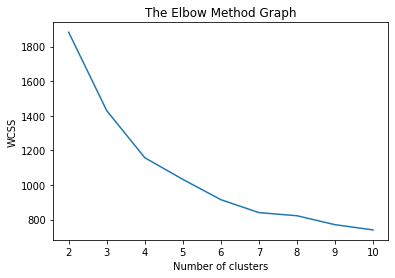

In [6]:
k_medoid_wcss(PL_1st)

In [3]:
#令k=7，method改为pam
kmedoids = KMedoids(n_clusters=7, method='pam', random_state=42).fit(PL_1st)

In [4]:
# 导入原始轨迹数据
trajectory = np.loadtxt('data/trajectory_in_week.txt')

In [5]:
trajectory_0 = trajectory[np.where(kmedoids.labels_==0)]
trajectory_1 = trajectory[np.where(kmedoids.labels_==1)]
trajectory_2 = trajectory[np.where(kmedoids.labels_==2)]
trajectory_3 = trajectory[np.where(kmedoids.labels_==3)]
trajectory_4 = trajectory[np.where(kmedoids.labels_==4)]
trajectory_5 = trajectory[np.where(kmedoids.labels_==5)]
trajectory_6 = trajectory[np.where(kmedoids.labels_==6)]

In [6]:
print(len(trajectory_0),len(trajectory_1),len(trajectory_2),len(trajectory_3),len(trajectory_4),len(trajectory_5),len(trajectory_6))

189 198 121 181 138 122 68


In [16]:
len(trajectory)

1017

Text(0.5, 1.0, 'label5_sample')

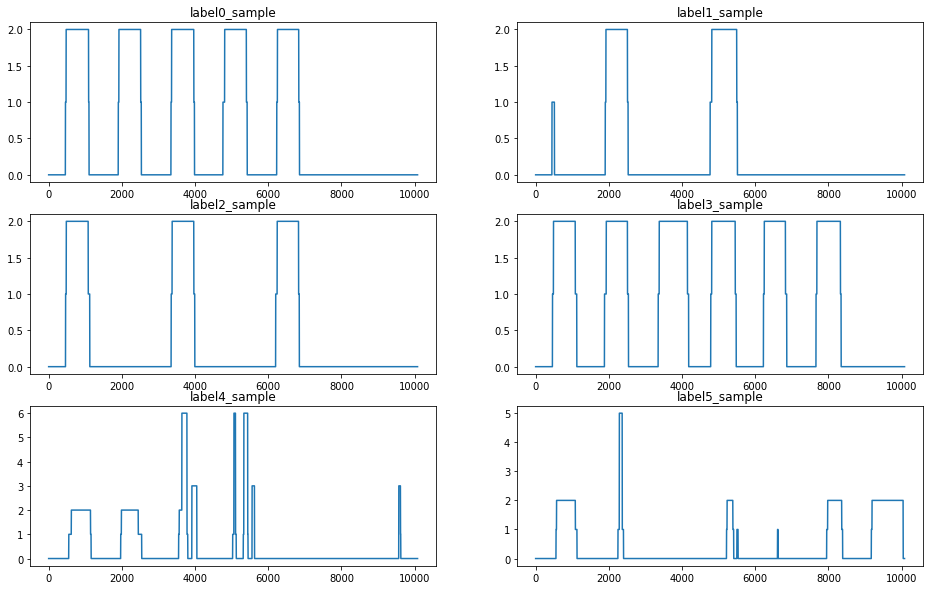

In [10]:
# 画图
fig, ax = plt.subplots(3,2,figsize=(16,10))

ax[0,0].plot(trajectory_1[0])
ax[0,0].set_title('label0_sample')

ax[0,1].plot(trajectory_1[1])
ax[0,1].set_title('label1_sample')

ax[1,0].plot(trajectory_1[2])
ax[1,0].set_title('label2_sample')

ax[1,1].plot(trajectory_1[3])
ax[1,1].set_title('label3_sample')

ax[2,0].plot(trajectory_1[4])
ax[2,0].set_title('label4_sample')

ax[2,1].plot(trajectory_1[5])
ax[2,1].set_title('label5_sample')

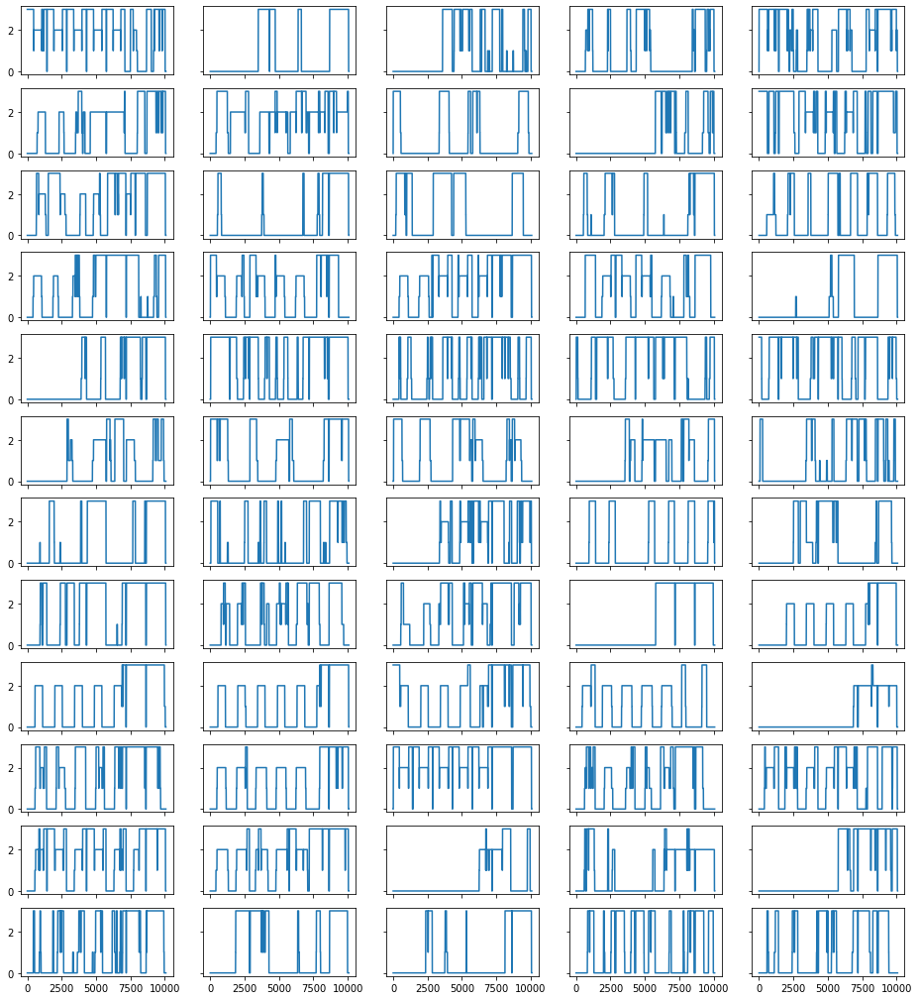

In [15]:
# 看进聚类结果
fig, ax = plt.subplots(12, 5, sharex=True, sharey=True, figsize=(16,18))

for i in range(12):
    for j in range(5):
        flag = i * 5 + j
        ax[i,j].plot(trajectory_6[flag])

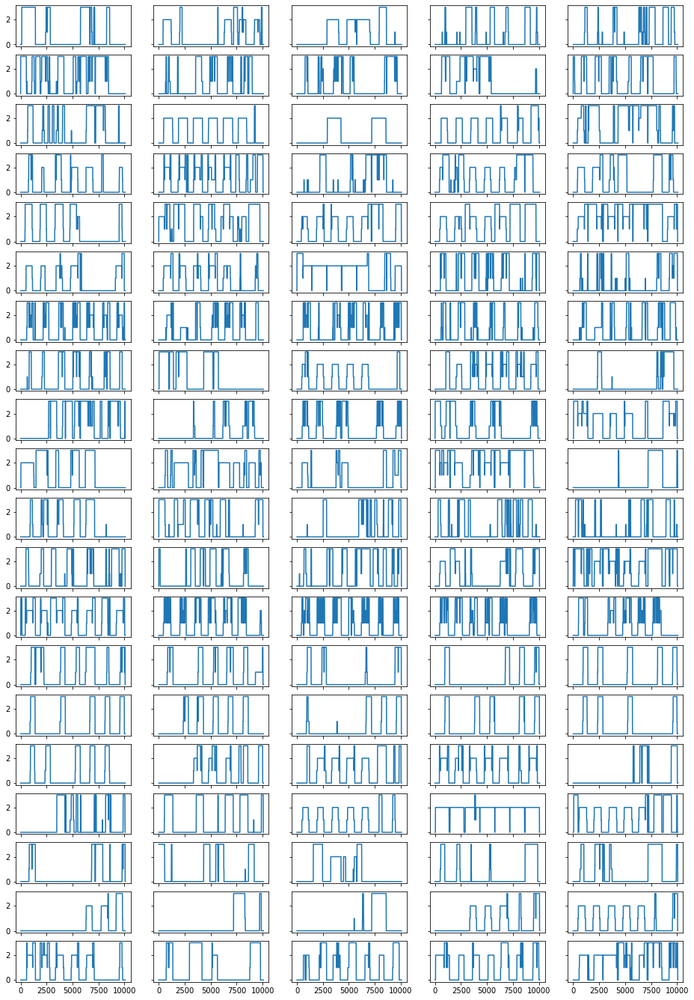

In [11]:
# 看进聚类结果
fig, ax = plt.subplots(20, 5, sharex=True, sharey=True, figsize=(16,24))

for i in range(20):
    for j in range(5):
        flag = i * 5 + j
        ax[i,j].plot(trajectory_4[flag])

## kmeans++聚类

In [18]:
# k-means聚类，wcss确定簇数

def kmeans_wcss(PL_1st):
    wcss = [] 
    for i in range(1, 11): 
        kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 0)
        kmeans.fit(PL_1st) 
        wcss.append(kmeans.inertia_)

    plt.plot(range(1, 11), wcss)
    plt.xlabel('Number of clusters')
    plt.ylabel('WCSS') 
    plt.show()

In [42]:
kmeans = KMeans(n_clusters = 3, init = "k-means++", random_state = 42)
y_kmeans = kmeans.fit_predict(PL_1st)

In [45]:
trajectory_0_km = trajectory[np.where(y_kmeans==0)]
trajectory_1_km = trajectory[np.where(y_kmeans==1)]
trajectory_2_km = trajectory[np.where(y_kmeans==2)]
print(len(trajectory_0_km),len(trajectory_1_km),len(trajectory_2_km))

In [22]:
# 看进聚类结果(输出类别中的前m×n条轨迹)
def plot_trajectory(data,m=20,n=5,figsize_x=16,figsize_y=24):
    
    fig, ax = plt.subplots(m, n, sharex=True, sharey=True, figsize=(figsize_x,figsize_y))
    for i in range(m):
        for j in range(n):
            flag = i * n + j
            ax[i,j].plot(data[flag],linewidth=1)
            for day in range(1,7):
                ax[i,j].plot([1440*day,1440*day],[-0.5,3.5],'k--',linewidth = 0.5)
            ax[i,j].set_ylim((-0.2, 3.2))

## 选取代表性序列

In [49]:
center_index = kmedoids.medoid_indices_

(0.0, 3.0)

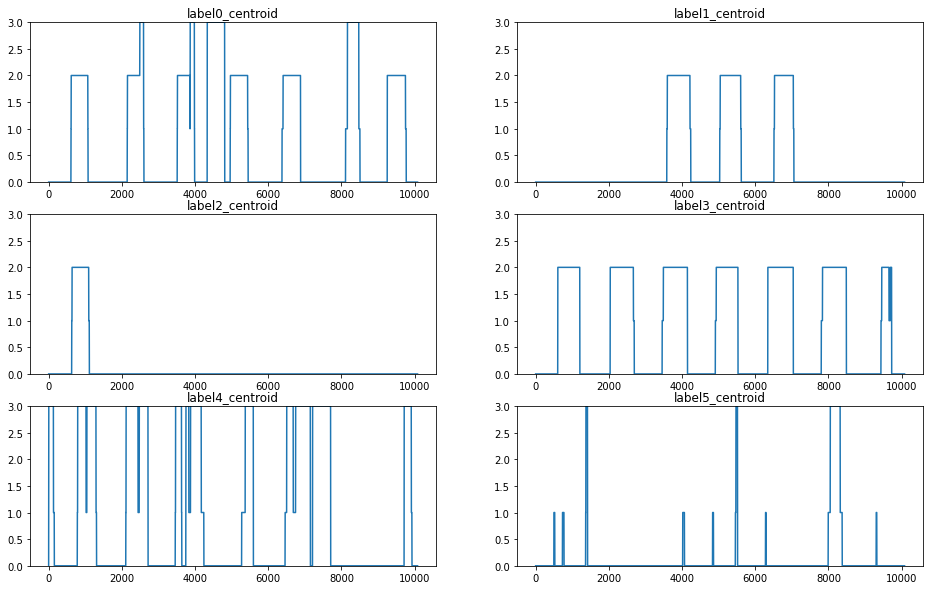

In [52]:
# 画图
fig, ax = plt.subplots(3,2,figsize=(16,10))

ax[0,0].plot(trajectory[center_index[0]])
ax[0,0].set_title('label0_centroid')
ax[0,0].set_ylim((0,3))

ax[0,1].plot(trajectory[center_index[1]])
ax[0,1].set_title('label1_centroid')
ax[0,1].set_ylim((0,3))

ax[1,0].plot(trajectory[center_index[2]])
ax[1,0].set_title('label2_centroid')
ax[1,0].set_ylim((0,3))

ax[1,1].plot(trajectory[center_index[3]])
ax[1,1].set_title('label3_centroid')
ax[1,1].set_ylim((0,3))

ax[2,0].plot(trajectory[center_index[4]])
ax[2,0].set_title('label4_centroid')
ax[2,0].set_ylim((0,3))

ax[2,1].plot(trajectory[center_index[5]])
ax[2,1].set_title('label5_centroid')
ax[2,1].set_ylim((0,3))

# 为提升聚类效果而进行的改进

## 1. 精简ptype：0-居家，1-出行，2-家外活动

In [8]:
#读入一阶持续景观
PL_1st_2ptype = np.loadtxt('data/1st_order_pl_2ptype.txt')
len(PL_1st_2ptype)

1017

In [7]:
# 确定聚类簇数
kmeans_wcss(PL_1st_2ptype)

NameError: name 'PL_1st_2ptype' is not defined

In [10]:
# n_clusters=3
kmeans = KMeans(n_clusters = 3, init = "k-means++", random_state = 42)
y_kmeans = kmeans.fit_predict(PL_1st_2ptype)

In [12]:
# 导入原始轨迹数据
trajectory_2ptype = np.loadtxt('data/trajectory_in_week_2ptype.txt')

In [13]:
trajectory_0_km = trajectory_2ptype[np.where(y_kmeans==0)]
trajectory_1_km = trajectory_2ptype[np.where(y_kmeans==1)]
trajectory_2_km = trajectory_2ptype[np.where(y_kmeans==2)]
print(len(trajectory_0_km),len(trajectory_1_km),len(trajectory_2_km))

303 497 217


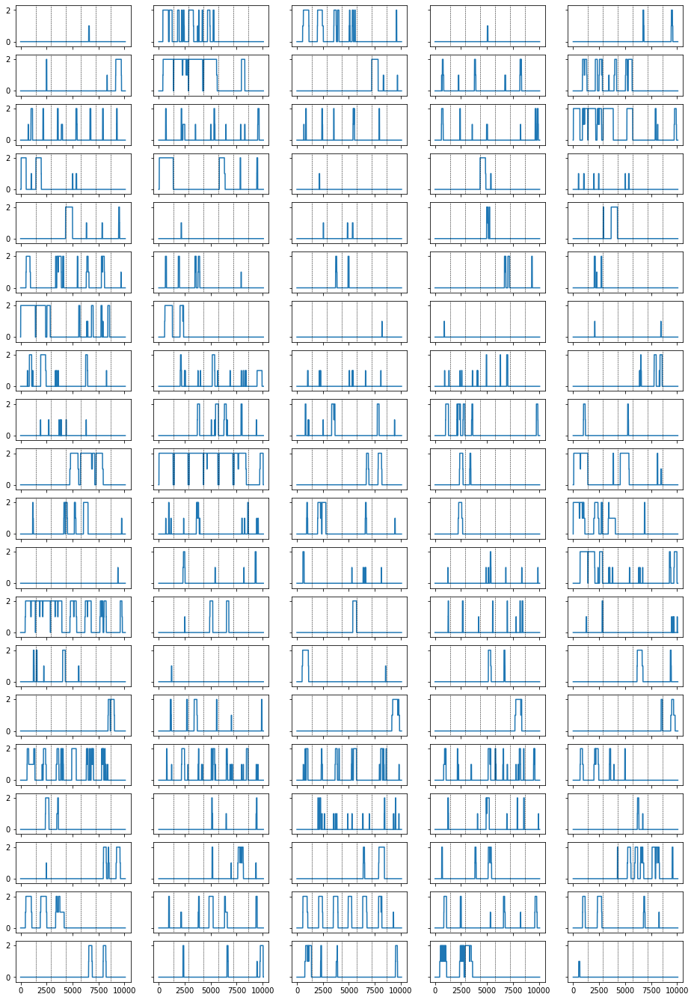

In [28]:
# 看进聚类结果，label=0
plot_trajectory(trajectory_0_km)

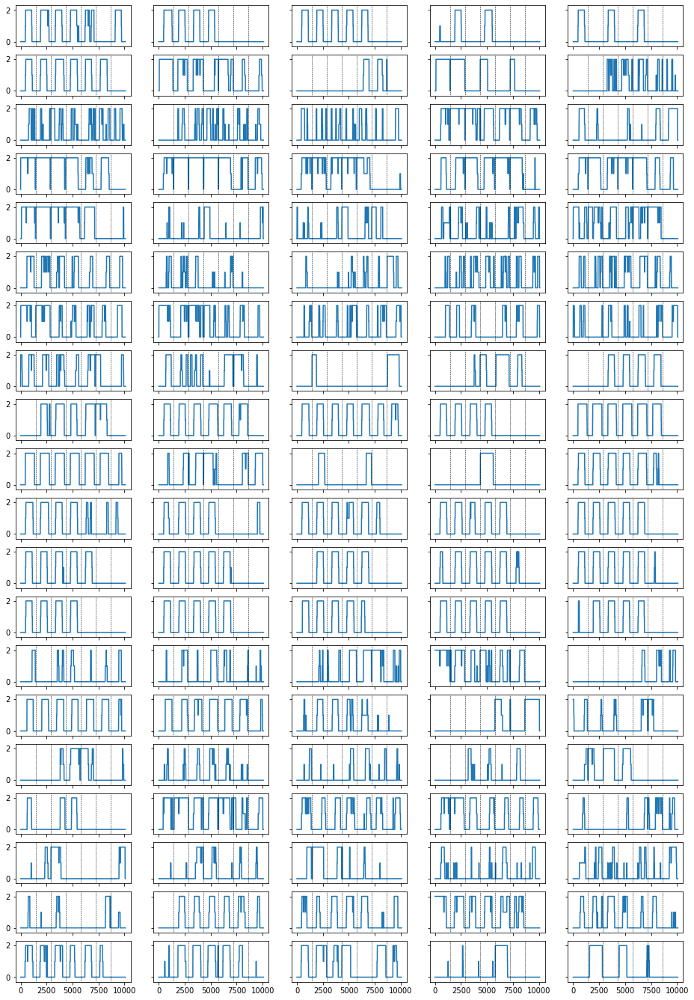

In [29]:
# 看进聚类结果，label=1
plot_trajectory(trajectory_1_km)

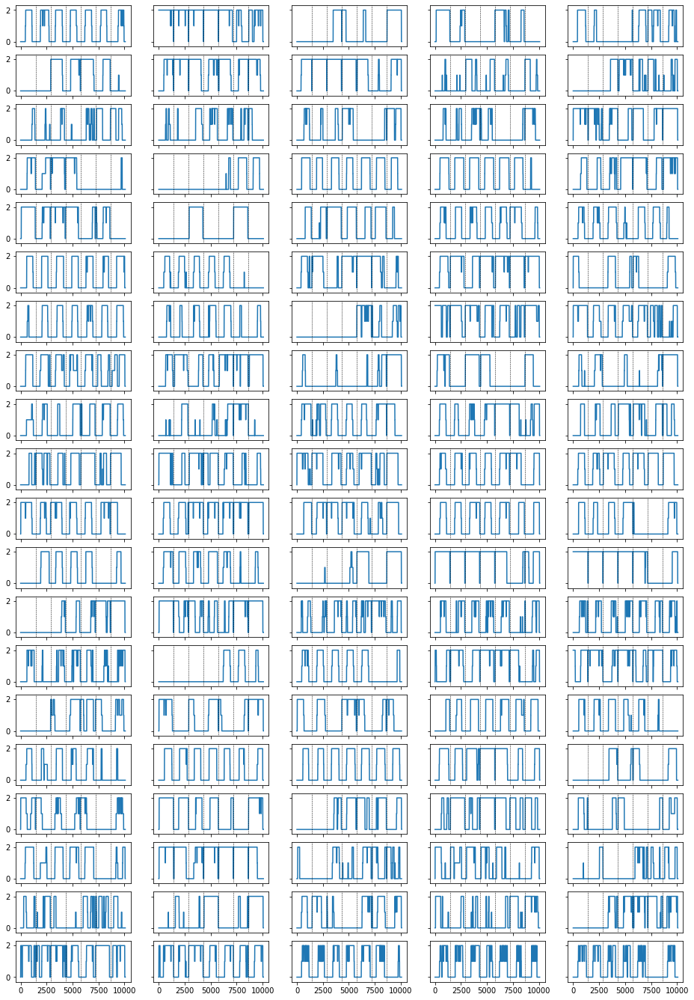

In [30]:
# 看进聚类结果，label=2
plot_trajectory(trajectory_2_km)

## 2. 更换数据源（2019年下半年数据）

In [2]:
#读入一阶持续景观
PL_1st_2ptype_2019 = np.loadtxt('data/1st_order_pl_2ptype_2019.txt')
len(PL_1st_2ptype_2019)

2281

In [3]:
# 数据标准化
Standardize = preprocessing.StandardScaler()
X = Standardize.fit_transform(PL_1st_2ptype_2019)
#feature_std = pd.DataFrame(Standardize,index=act_feature_3.index,columns=act_feature_3.columns)

### method 1: k-means++

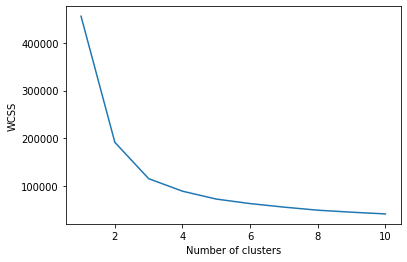

In [20]:
# 确定聚类簇数
kmeans_wcss(X)

从手肘图可见，3类或4类都是可以的

### n_clusters=3

In [4]:
kmeans = KMeans(n_clusters = 3, init = "k-means++", random_state = 0)
y_kmeans = kmeans.fit_predict(X)

In [5]:
# 导入原始轨迹数据
trajectory_2ptype_2019 = np.loadtxt('data/trajectory_in_week_2ptype_2019.txt')

In [7]:
trajectory_0_km = trajectory_2ptype_2019[np.where(y_kmeans==0)]
trajectory_1_km = trajectory_2ptype_2019[np.where(y_kmeans==1)]
trajectory_2_km = trajectory_2ptype_2019[np.where(y_kmeans==2)]
print(len(trajectory_0_km),len(trajectory_1_km),len(trajectory_2_km))

1058 570 653


In [8]:
trajectory_2ptype_2019

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

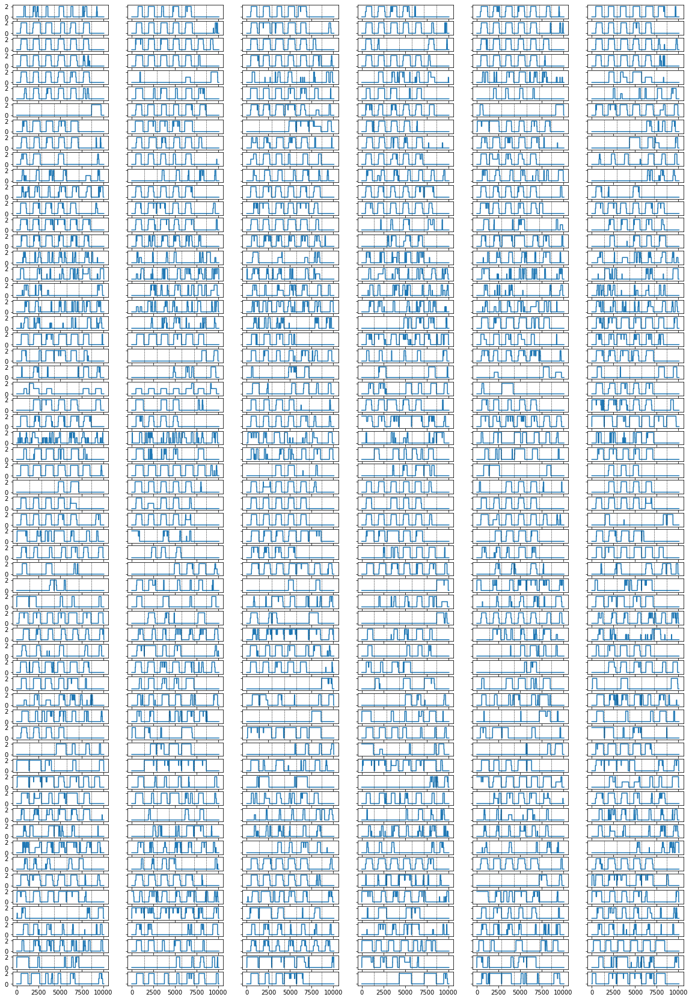

In [28]:
# 看进聚类结果，label=0
plot_trajectory(trajectory_0_km,m=60,n=6,figsize_x=20,figsize_y=30)

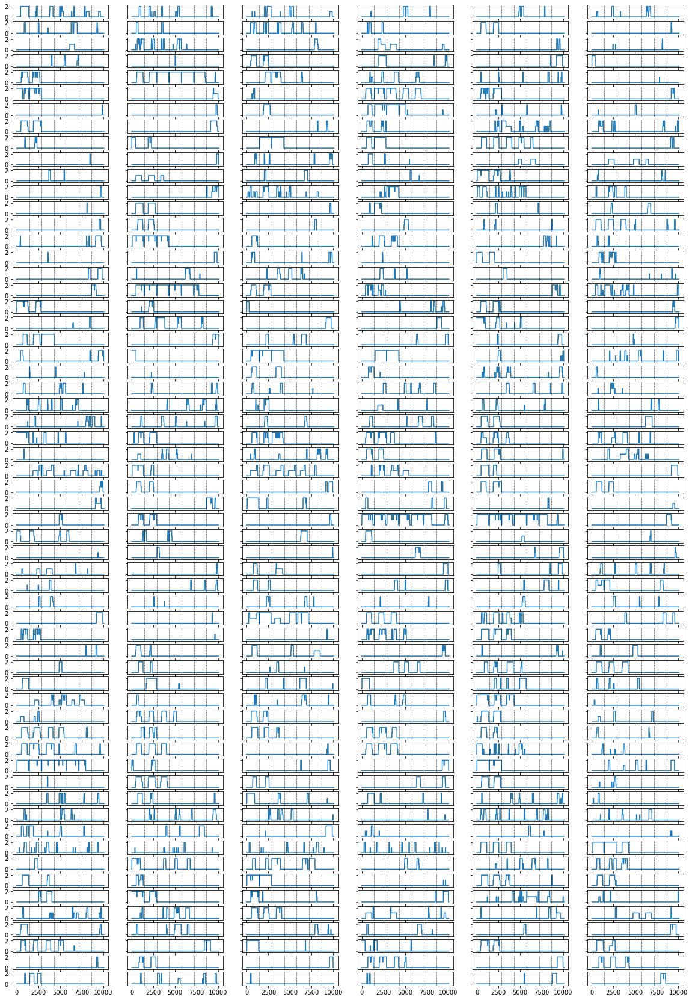

In [29]:
# 看进聚类结果，label=1
plot_trajectory(trajectory_1_km,m=60,n=6,figsize_x=20,figsize_y=30)

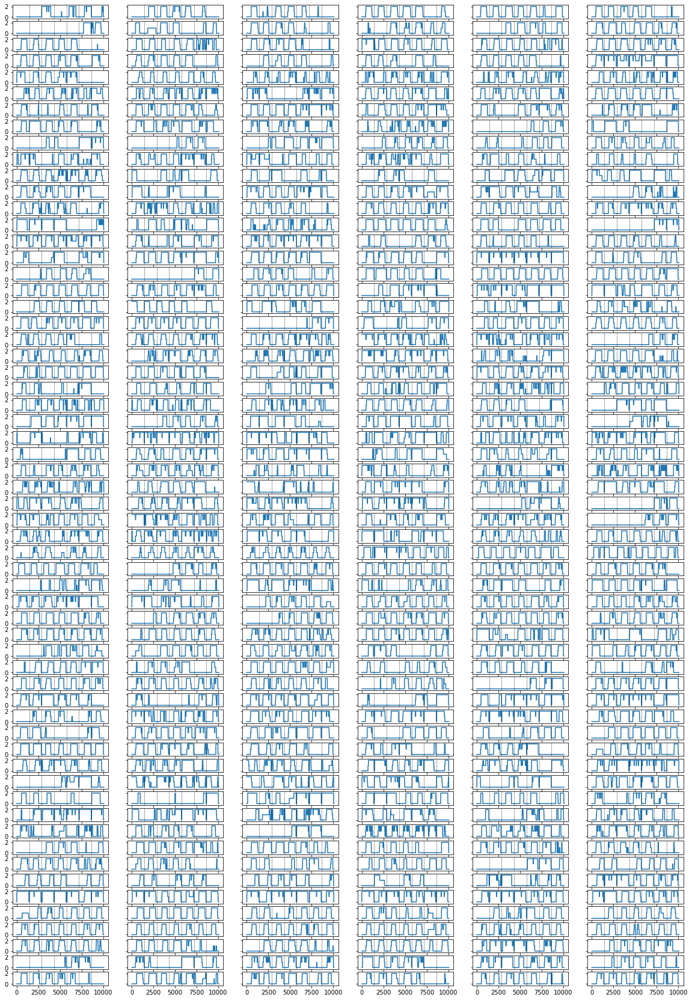

In [30]:
# 看进聚类结果，label=2
plot_trajectory(trajectory_2_km,m=60,n=6,figsize_x=20,figsize_y=30)

### n_clusters = 4

In [23]:
kmeans1 = KMeans(n_clusters = 4, init = "k-means++", random_state = 0)
y_kmeans1 = kmeans1.fit_predict(X)

In [24]:
trajectory_0_km = trajectory_2ptype_2019[np.where(y_kmeans1==0)]
trajectory_1_km = trajectory_2ptype_2019[np.where(y_kmeans1==1)]
trajectory_2_km = trajectory_2ptype_2019[np.where(y_kmeans1==2)]
trajectory_3_km = trajectory_2ptype_2019[np.where(y_kmeans1==3)]
print(len(trajectory_0_km),len(trajectory_1_km),len(trajectory_2_km),len(trajectory_3_km))

832 699 313 437


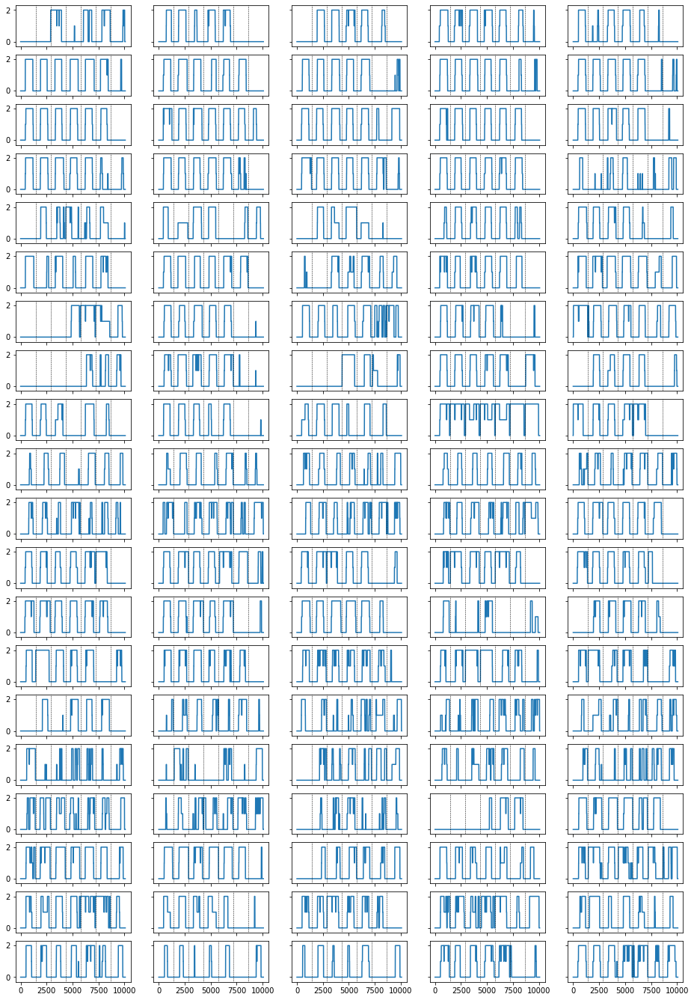

In [25]:
# 看进聚类结果，label=0
plot_trajectory(trajectory_0_km)

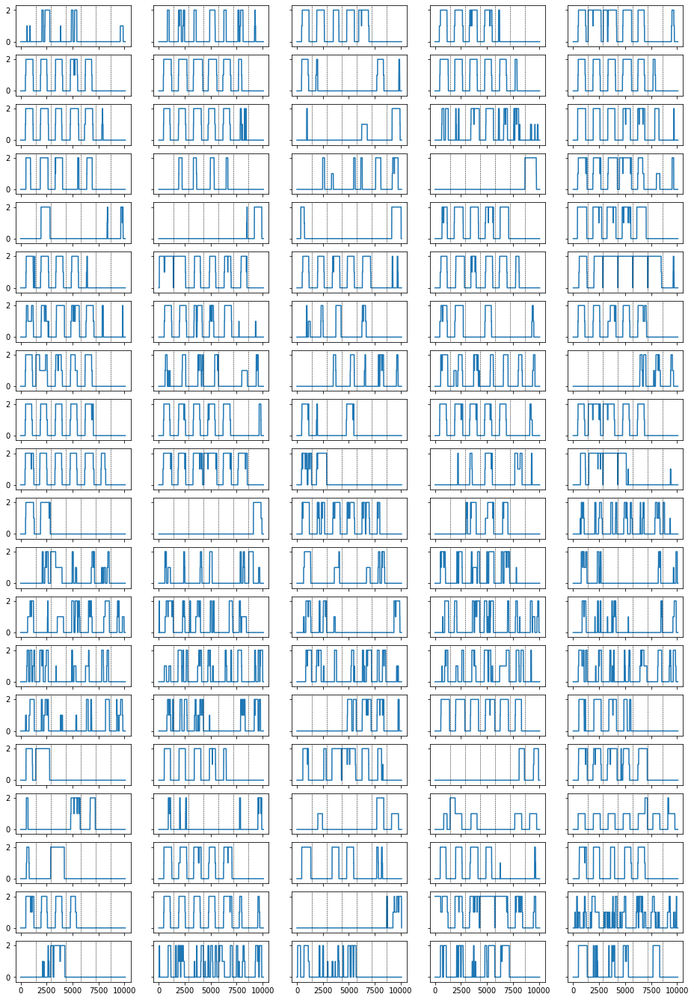

In [26]:
# 看进聚类结果，label=1
plot_trajectory(trajectory_1_km)

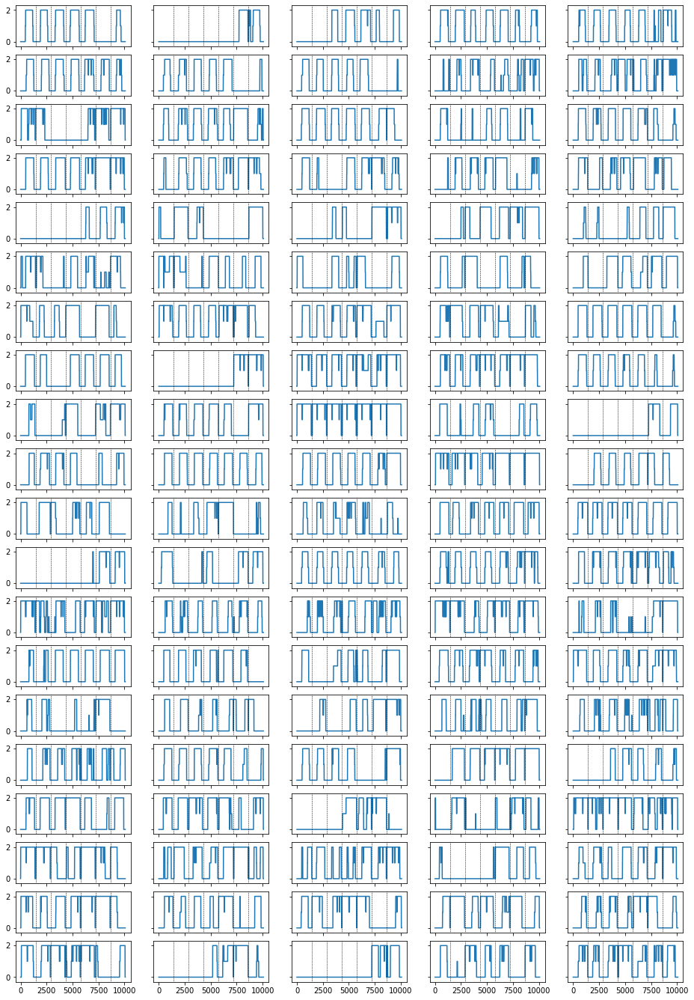

In [27]:
# 看进聚类结果，label=2
plot_trajectory(trajectory_2_km)

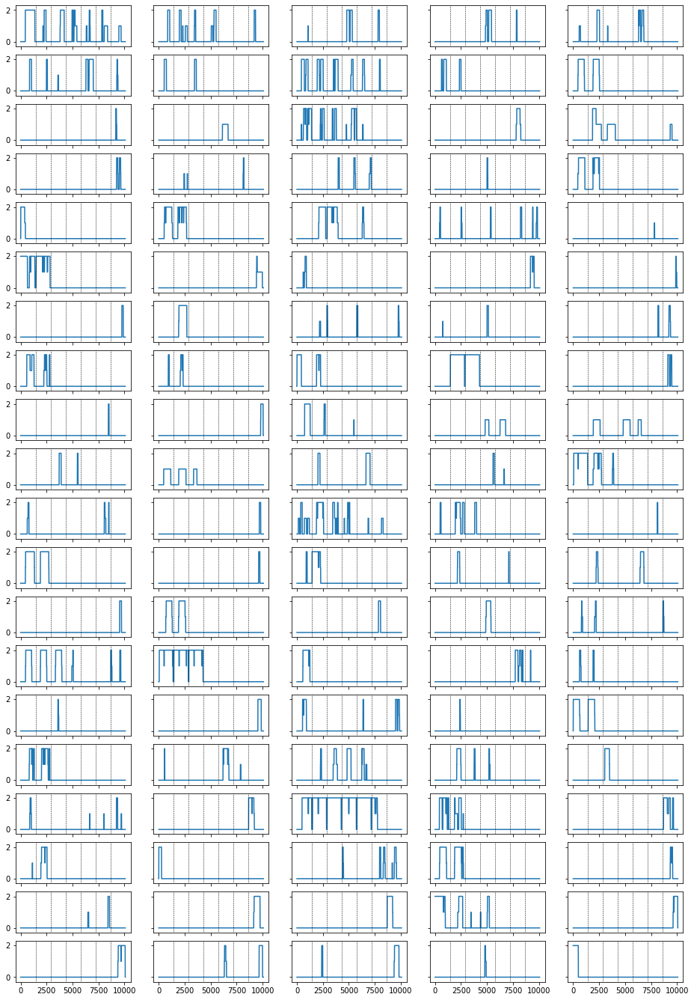

In [28]:
# 看进聚类结果，label=3
plot_trajectory(trajectory_3_km)

### method 2： k-mediod

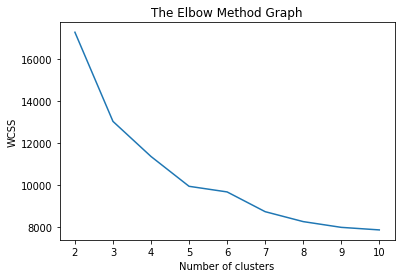

In [31]:
k_medoid_wcss(X)

In [34]:
# 令clusters = 5
kmedoids = KMedoids(n_clusters=5, method='pam', max_iter=500 ,random_state=0).fit(PL_1st_2ptype_2019)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn_extra\cluster\_k_medoids.py:243: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(


In [33]:
help(KMedoids)

Help on class KMedoids in module sklearn_extra.cluster._k_medoids:

class KMedoids(sklearn.base.BaseEstimator, sklearn.base.ClusterMixin, sklearn.base.TransformerMixin)
 |  KMedoids(n_clusters=8, metric='euclidean', method='alternate', init='heuristic', max_iter=300, random_state=None)
 |  
 |  k-medoids clustering.
 |  
 |  Read more in the :ref:`User Guide <k_medoids>`.
 |  
 |  Parameters
 |  ----------
 |  n_clusters : int, optional, default: 8
 |      The number of clusters to form as well as the number of medoids to
 |      generate.
 |  
 |  metric : string, or callable, optional, default: 'euclidean'
 |      What distance metric to use. See :func:metrics.pairwise_distances
 |      metric can be 'precomputed', the user must then feed the fit method
 |      with a precomputed kernel matrix and not the design matrix X.
 |  
 |  method : {'alternate', 'pam'}, default: 'alternate'
 |      Which algorithm to use. 'alternate' is faster while 'pam' is more accurate.
 |  
 |  init : {'r

In [35]:
trajectory_0 = trajectory_2ptype_2019[np.where(kmedoids.labels_==0)]
trajectory_1 = trajectory_2ptype_2019[np.where(kmedoids.labels_==1)]
trajectory_2 = trajectory_2ptype_2019[np.where(kmedoids.labels_==2)]
trajectory_3 = trajectory_2ptype_2019[np.where(kmedoids.labels_==3)]
trajectory_4 = trajectory_2ptype_2019[np.where(kmedoids.labels_==4)]
print(len(trajectory_0),len(trajectory_1),len(trajectory_2),len(trajectory_3),len(trajectory_4))

414 623 378 624 242


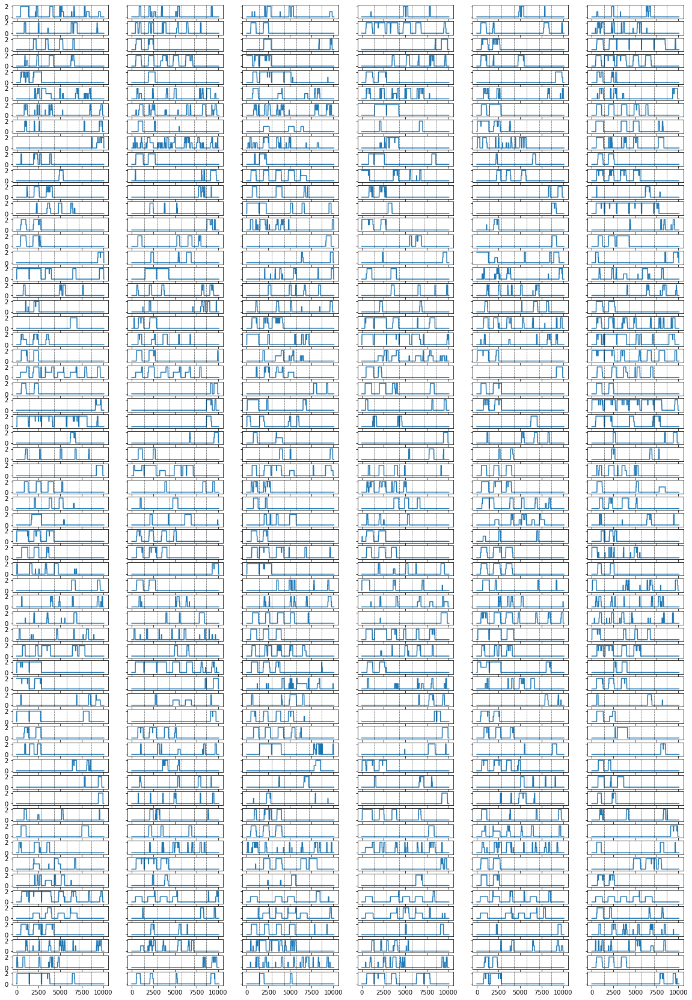

In [36]:
# 看进聚类结果，label=0
plot_trajectory(trajectory_0,m=60,n=6,figsize_x=20,figsize_y=30)

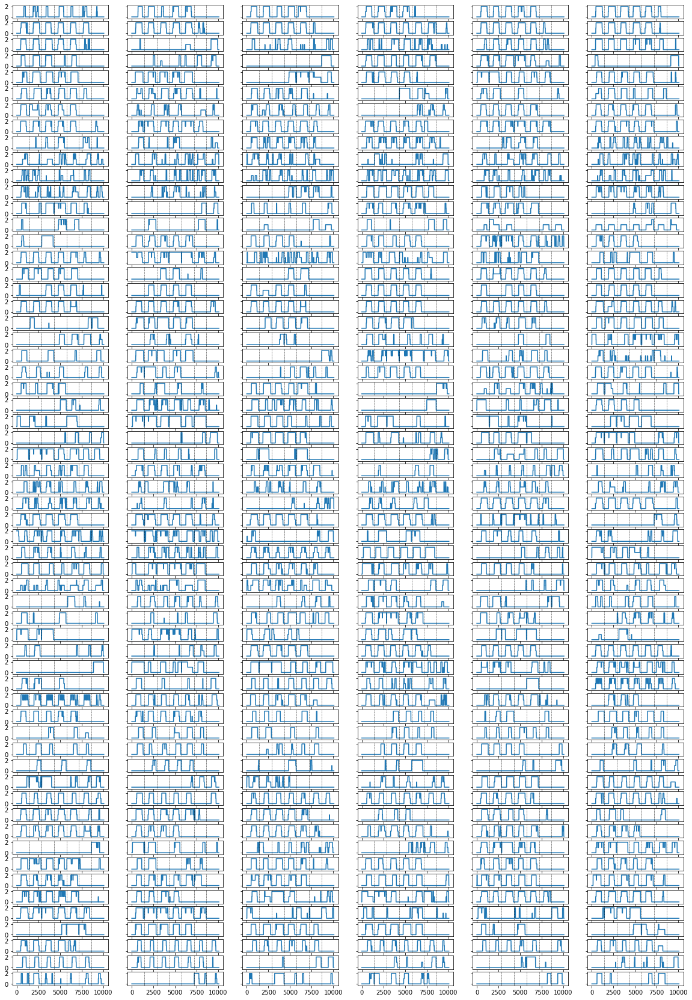

In [37]:
# 看进聚类结果，label=1
plot_trajectory(trajectory_1,m=60,n=6,figsize_x=20,figsize_y=30)

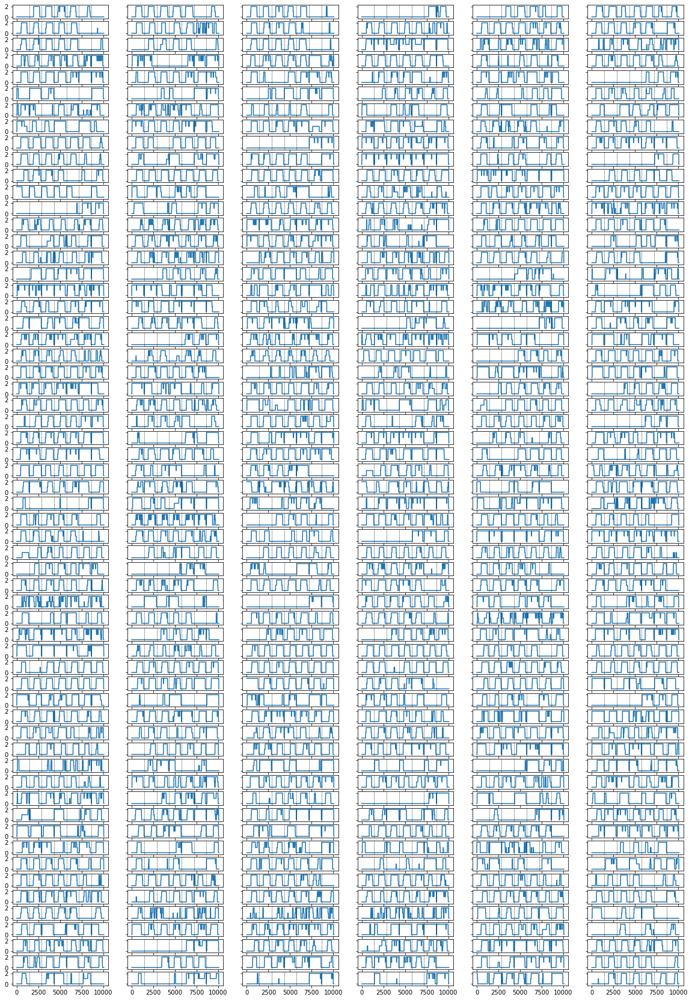

In [38]:
# 看进聚类结果，label=2
plot_trajectory(trajectory_2,m=60,n=6,figsize_x=20,figsize_y=30)

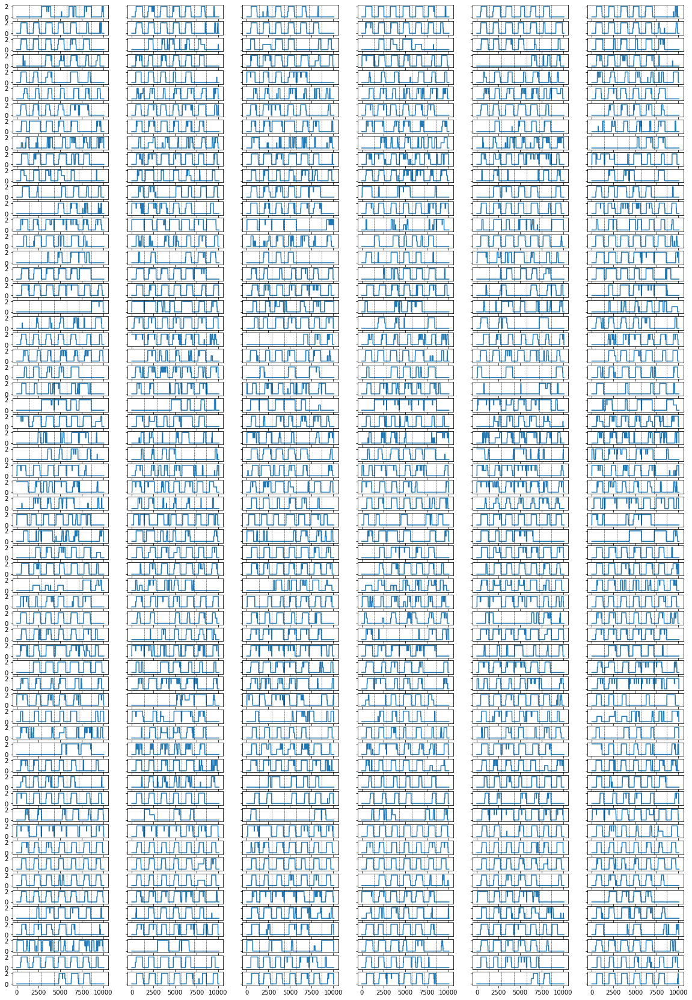

In [39]:
# 看进聚类结果，label=3
plot_trajectory(trajectory_3,m=60,n=6,figsize_x=20,figsize_y=30)

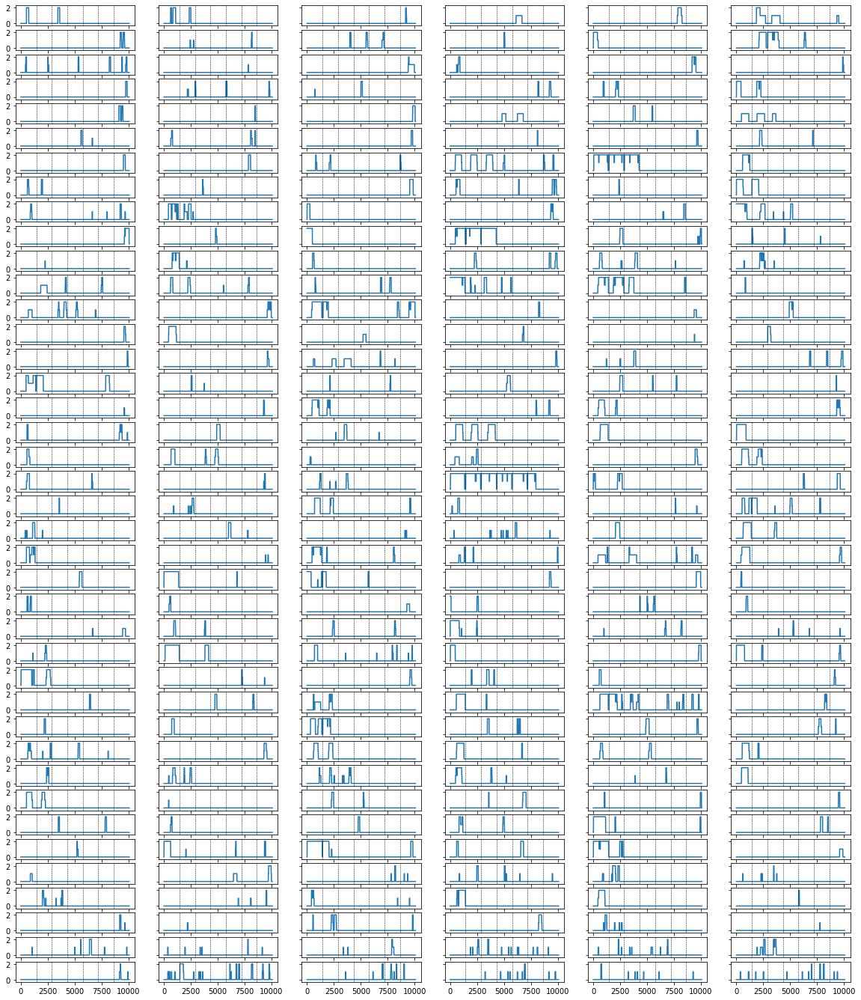

In [40]:
# 看进聚类结果，label=4
plot_trajectory(trajectory_4,m=40,n=6,figsize_x=20,figsize_y=24)

## 3. 改进聚类算法

### （1）试试fuzzy c-means
source：https://www.kaggle.com/code/prateekk94/fuzzy-c-means-clustering-on-iris-dataset/notebook#Introduction

In [2]:
from fcmeans import FCM

In [ ]:
fcm = FCM(n_clusters=i)
fcm.fit(X)
labels = fcm.predict(X)

### （2）亲和力传播 + kmeans（allahviranloo2016）

In [41]:
#计算affinity propagation
af = AffinityPropagation(damping=0.55,max_iter=500,preference=-1000,random_state=42).fit(X)

In [42]:
cluster_centers_indices = af.cluster_centers_indices_
init_centroid = X[cluster_centers_indices]

n_clusters_ = len(cluster_centers_indices)
print(n_clusters_)

6


In [43]:
# kmeans
kmeans = KMeans(n_clusters = n_clusters_, init = init_centroid, random_state = 42, n_init=1)
y_kmeans = kmeans.fit_predict(X)

In [44]:
pd.value_counts(y_kmeans.reshape(len(y_kmeans)))

2    421
1    402
3    259
5    178
4     52
0      4
dtype: int64

## 4. 其他时频转换方法（FWHT）

In [6]:
#读入一阶持续景观
PL_1st_2ptype_2019_fwht = np.loadtxt('data/1st_order_pl_2ptype_2019_FWHT.txt')
PL_1st_2ptype_2019_fwht.shape

(2281, 200)

In [4]:
# 数据标准化
Standardize = preprocessing.StandardScaler()
X = Standardize.fit_transform(PL_1st_2ptype_2019_fwht)

In [57]:
# kmeans (kmeans++初始化)
kmeans = KMeans(n_clusters = 3, init = "k-means++", random_state = 0)
y_kmeans = kmeans.fit_predict(X)

In [6]:
# 导入原始轨迹数据
trajectory_2ptype_2019 = np.loadtxt('data/trajectory_in_week_2ptype_2019.txt')

In [58]:
trajectory_0_km = trajectory_2ptype_2019[np.where(y_kmeans==0)]
trajectory_1_km = trajectory_2ptype_2019[np.where(y_kmeans==1)]
trajectory_2_km = trajectory_2ptype_2019[np.where(y_kmeans==2)]
print(len(trajectory_0_km),len(trajectory_1_km),len(trajectory_2_km))

775 596 910


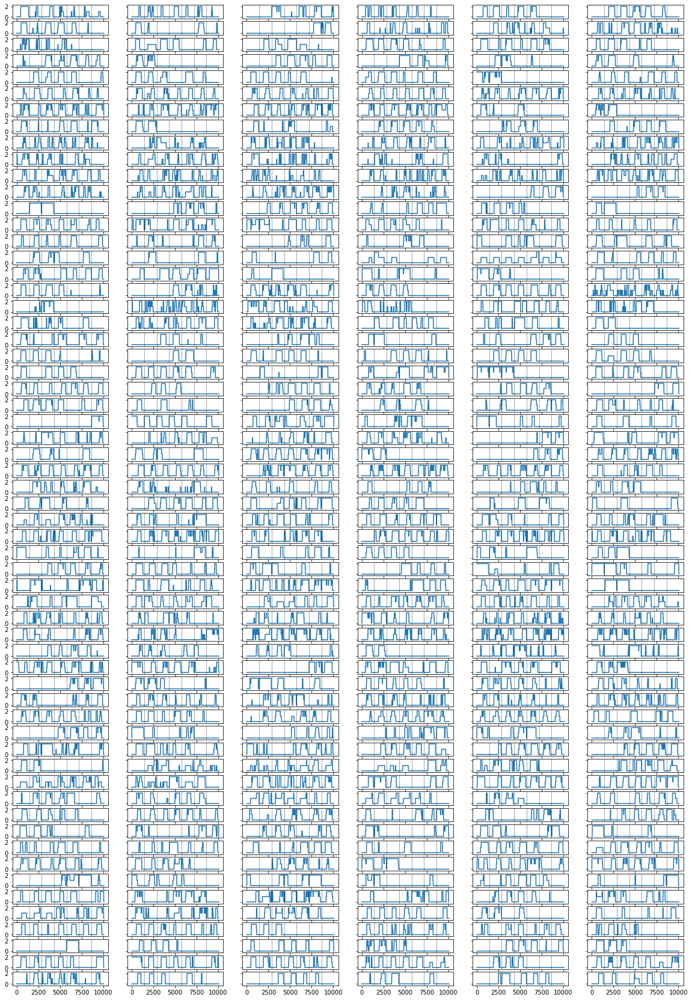

In [59]:
# 看进聚类结果，label=0
plot_trajectory(trajectory_0_km,m=60,n=6,figsize_x=20,figsize_y=30)

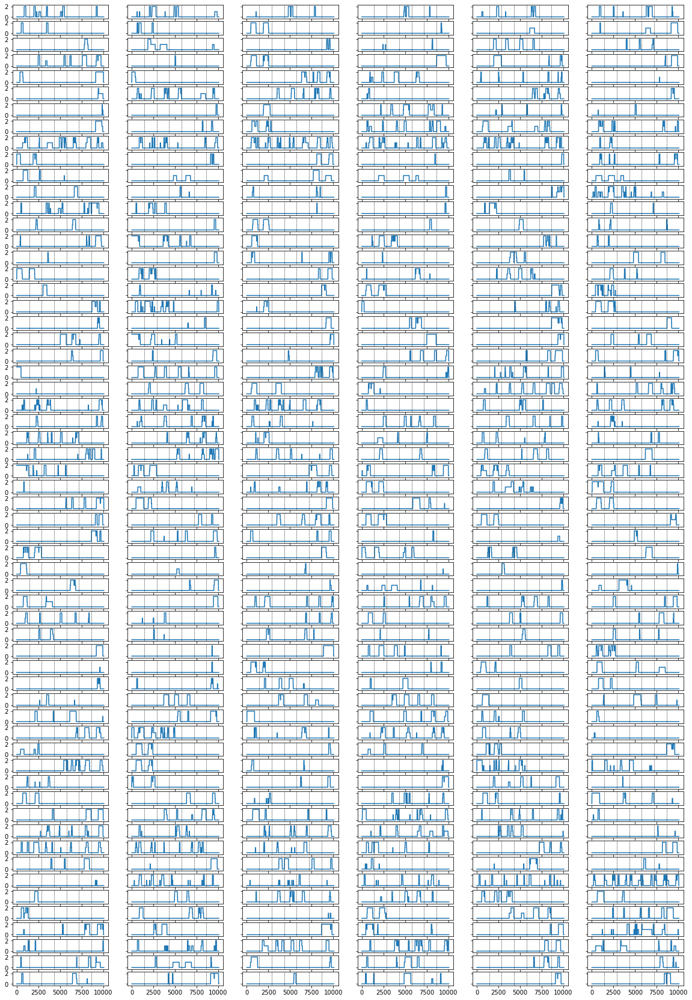

In [60]:
# 看进聚类结果，label=1
plot_trajectory(trajectory_1_km,m=60,n=6,figsize_x=20,figsize_y=30)

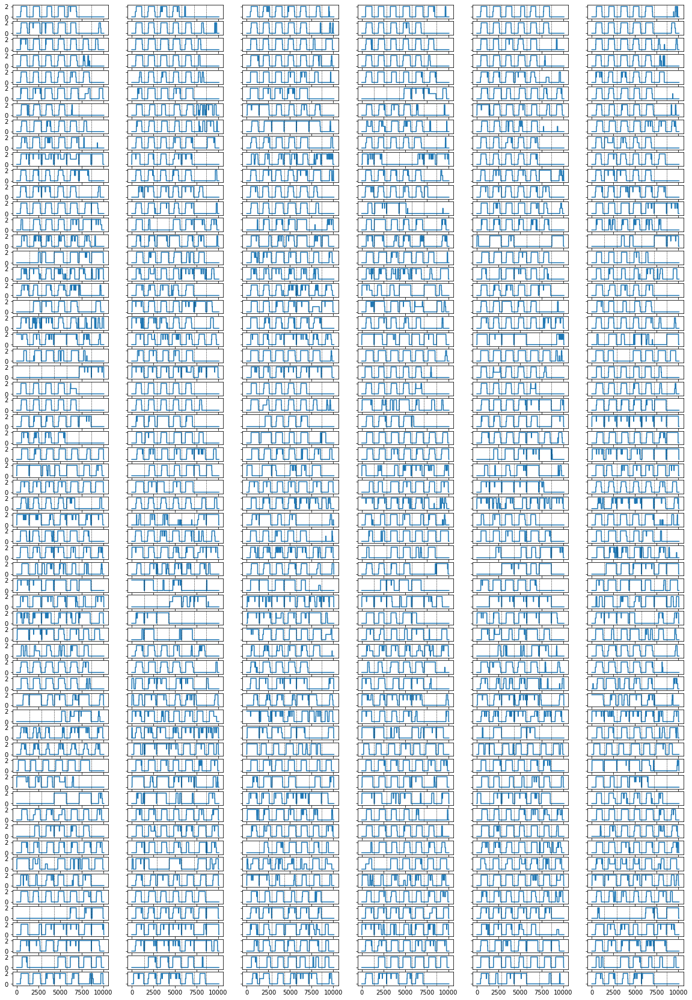

In [61]:
# 看进聚类结果，label=2
plot_trajectory(trajectory_2_km,m=60,n=6,figsize_x=20,figsize_y=30)

## 5.topological features + geometric features

In [4]:
#读入特征
topological_features = np.loadtxt('data/persistence_feature_week_notWTF_2019_58.txt')
np.array(topological_features).shape

(1316, 28)

In [5]:
# 导入原始轨迹数据
trajectory = np.loadtxt('data/trajectory_in_week_3ptype_2019_58.txt')
len(trajectory)

1316

In [6]:
# 导入每日数据和标签
trajectory_day = np.loadtxt('data/trajectory_in_day_3ptype_2019_58.txt')
geo_labels = np.loadtxt('data/geometry_label.txt')

In [7]:
#拼接几何特征
def extract_geo_label(trajectory_week,trajectory_day,day_label):
    geo_features = np.zeros((len(trajectory_week),len(pd.unique(day_label))))
    for i in range(len(trajectory_week)):
        for j in range(7):
            #contain = (trajectory[i][1440*j:1440*(j+1)] == trajectory_day).all(1).any()
            #先考虑全0轨迹
            tra = trajectory[i][1440*j:1440*(j+1)]
            if not np.any(tra): #若数组全0，not np.any()=True，则执行if下的语句
                #注意：在这里，全0轨迹归为标签1
                geo_features[i][1] += 1
            else:
                tra_index = np.flatnonzero((trajectory_day == tra).all(1))[0]  #找到这一天所对应轨迹的index
                #geo_index = day_label[tra_index]
                geo_features[i][int(day_label[tra_index])] += 1
    
    return geo_features

In [8]:
geo_features = extract_geo_label(trajectory,trajectory_day,geo_labels)

In [9]:
#特征拼接
features = np.hstack((topological_features,geo_features))
features.shape

(1316, 33)

### 纯点云拓扑特征聚类

In [8]:
features = topological_features

In [9]:
# 数据标准化
Standardize = preprocessing.StandardScaler()
X = Standardize.fit_transform(features)

In [14]:
trajectory_0 = trajectory[np.where(y_kmeans==0)]
trajectory_1 = trajectory[np.where(y_kmeans==1)]
trajectory_2 = trajectory[np.where(y_kmeans==2)]
trajectory_3 = trajectory[np.where(y_kmeans==3)]
trajectory_4 = trajectory[np.where(y_kmeans==4)]
trajectory_5 = trajectory[np.where(y_kmeans==5)]
#trajectory_6 = trajectory[np.where(y_kmeans==6)]
#trajectory_7 = trajectory[np.where(y_kmeans==7)]

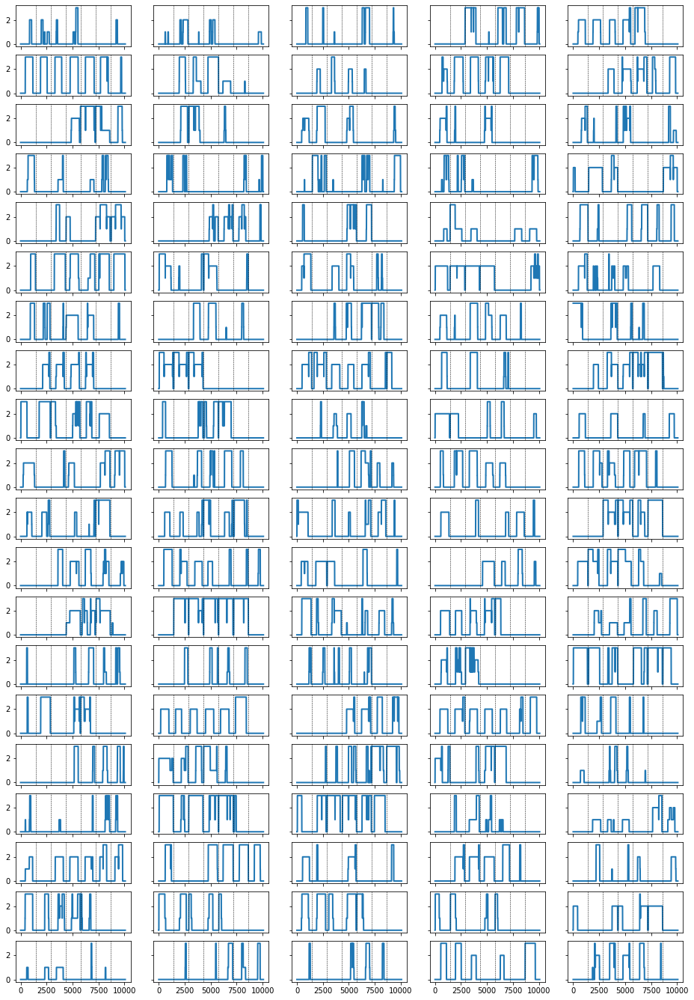

In [15]:
# 看进聚类结果，label=0
plot_trajectory(trajectory_0)

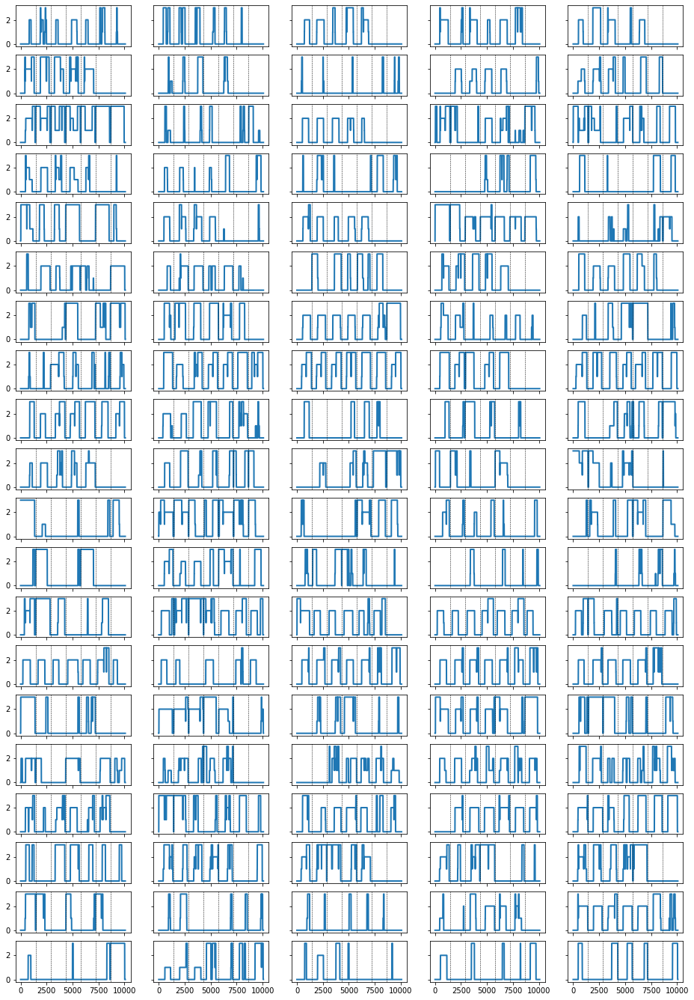

In [16]:
# 看进聚类结果，label=1
plot_trajectory(trajectory_1)

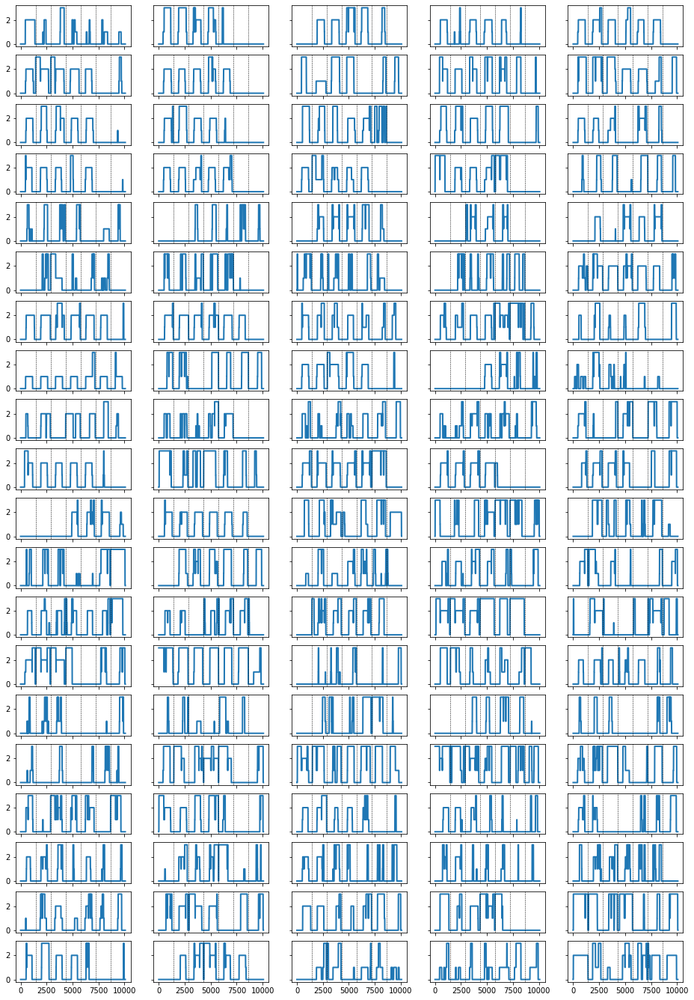

In [17]:
# 看进聚类结果，label=2
plot_trajectory(trajectory_2)

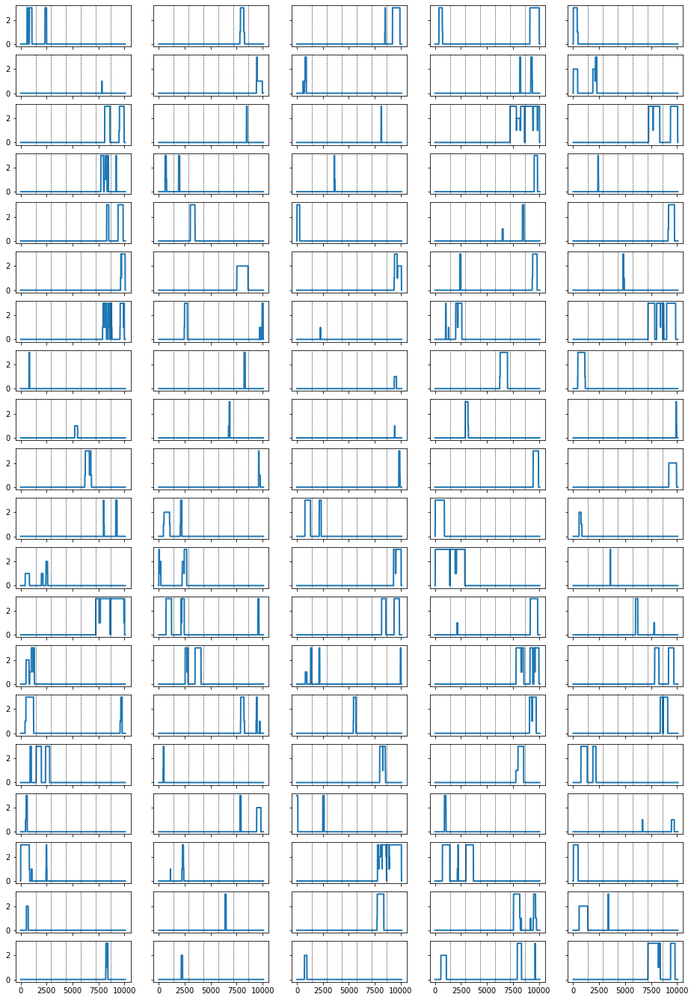

In [18]:
# 看进聚类结果，label=3
plot_trajectory(trajectory_3,m=20,n=5)

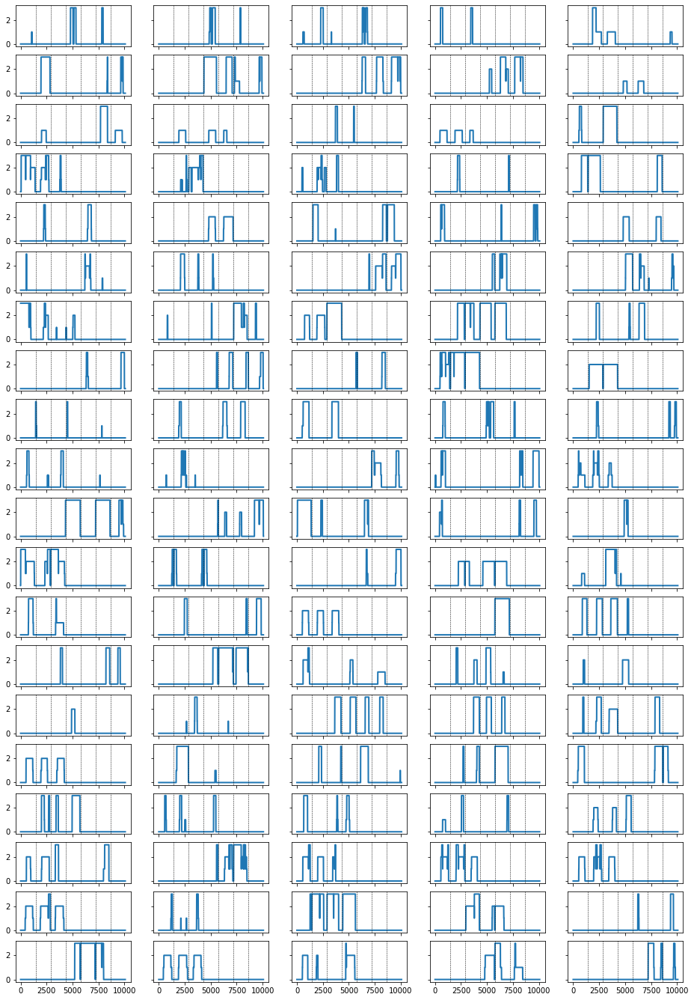

In [19]:
# 看进聚类结果，label=4
plot_trajectory(trajectory_4,m=20,n=5)

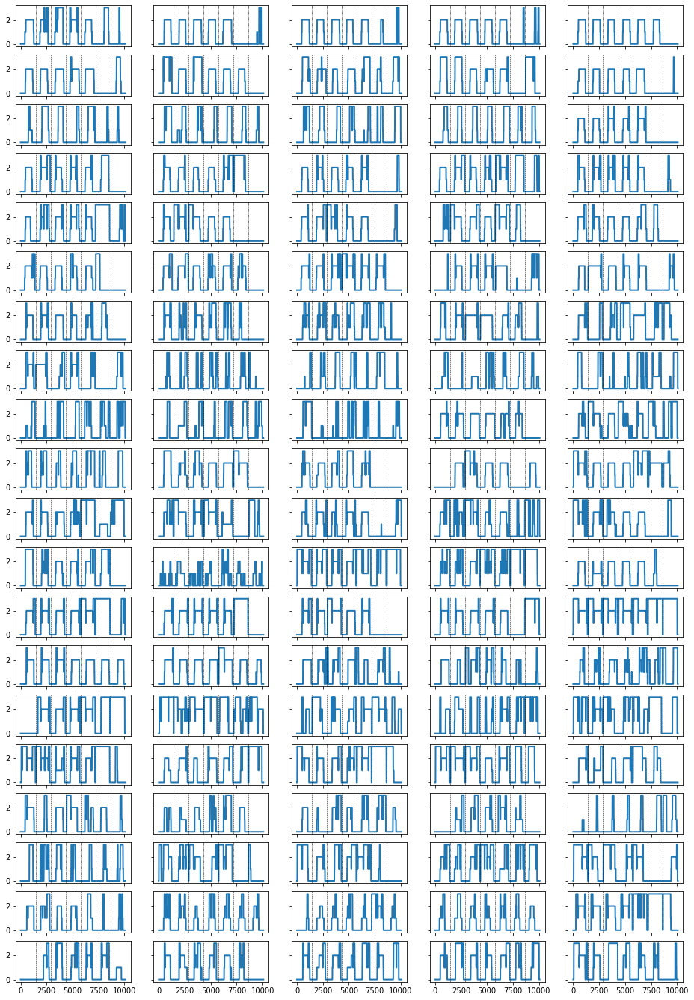

In [20]:
# 看进聚类结果，label=5
plot_trajectory(trajectory_5,m=20,n=5)

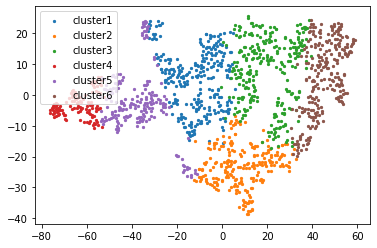

In [23]:
# 降维查看聚类效果
from sklearn.manifold import TSNE

tsne = TSNE(random_state=105)
tsne.fit_transform(X)                               # 进行数据降维到2维
tsne = pd.DataFrame(tsne.embedding_) # 转换数据格式

# 画图
for i in range(n_clusters_):
    d = tsne.loc[np.where(y_kmeans == i)]
    plt.scatter(d[0], d[1], s=5, label='cluster%s'%(i+1))
plt.legend(loc='upper left')

### 浅看一看每个pid的周轨迹所属的类别

In [25]:
# 读取pid标签
pid = np.loadtxt('data/pidindex_week_2019_58.txt')

In [26]:
data = {'pid':pid,
        'label':y_kmeans}

data = pd.DataFrame(data)

In [27]:
data.head(20)

,pid,label
0,90221.0,2
1,90221.0,0
2,90221.0,0
3,90221.0,1
4,90221.0,4
5,90221.0,4
6,90221.0,4
7,90221.0,0
8,90221.0,4
9,90221.0,0


### 来将点云拓扑特征和wft拓扑特征结合？

In [28]:
wtf_features = np.loadtxt('data/persistence_features_week_2019_58.txt')
np.array(wtf_features).shape

(1316, 14)

In [29]:
#特征拼接
features = np.hstack((topological_features,wtf_features))
features.shape

(1316, 42)

In [30]:
# 数据标准化
Standardize = preprocessing.StandardScaler()
X = Standardize.fit_transform(features)

In [45]:
trajectory_0 = trajectory[np.where(y_kmeans==0)]
trajectory_1 = trajectory[np.where(y_kmeans==1)]
trajectory_2 = trajectory[np.where(y_kmeans==2)]
trajectory_3 = trajectory[np.where(y_kmeans==3)]
trajectory_4 = trajectory[np.where(y_kmeans==4)]
trajectory_5 = trajectory[np.where(y_kmeans==5)]

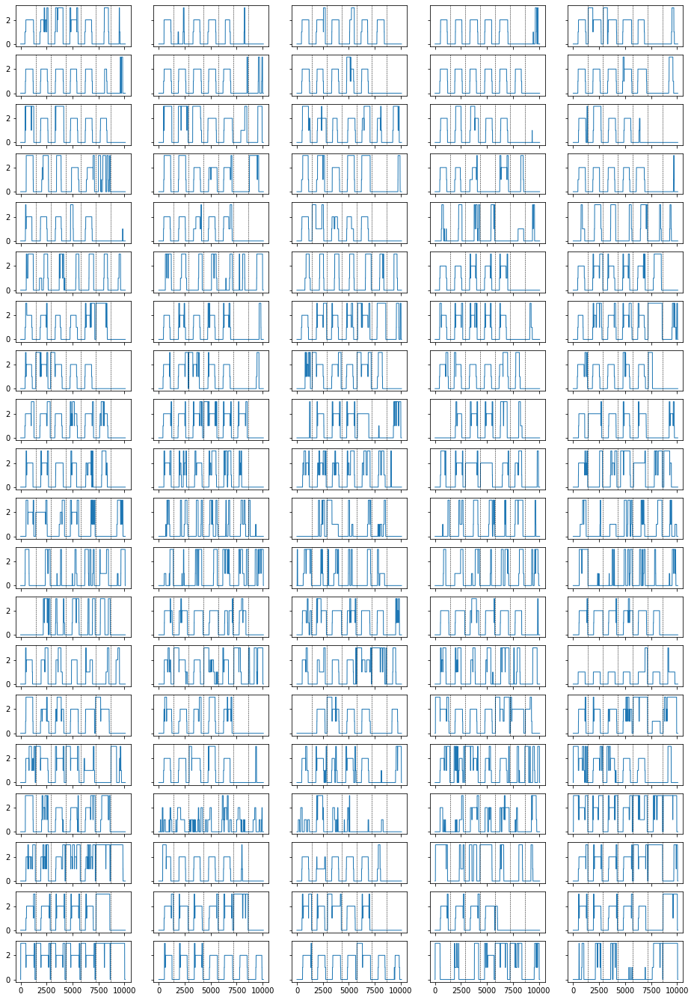

In [46]:
# 看进聚类结果，label=1
plot_trajectory(trajectory_1,m=20,n=5)

## CH得分

CH指标通过计算类中各点与类中心的距离平方和来度量类内的紧密度，通过计算各类中心点与数据集中心点距离平方和来度量数据集的分离度。

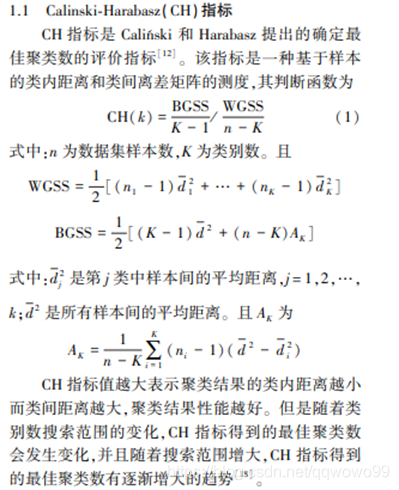

In [10]:
from sklearn.metrics import calinski_harabasz_score
from sklearn.manifold import TSNE

In [2]:
# 降维查看聚类效果
def tsne_vis1(X,n,labels):
#     colors=[[241/255,141/255,0/255],
#             [244/255,180/255,201/255],
#             [255/255,248/255,165/255],
#             [128/255,205/255,227/255],
#             [236/255,122/255,172/255],
#             [73/255,188/255,289/255],
#            [73/255,188/255,289/255]]
    
    tsne = TSNE(random_state=105)
    tsne.fit_transform(X)                               # 进行数据降维到2维
    tsne = pd.DataFrame(tsne.embedding_) # 转换数据格式

    # 画图
    plt.figure(dpi=120)
    for i in range(n):
        d = tsne.loc[np.where(labels == i)]
        plt.scatter(d[0], d[1], s=5, label='cluster%s'%(i+1))
    plt.xlabel('dimension 1',font1)
    plt.ylabel('dimension 2',font1)
    plt.legend(loc='upper left')

In [8]:
font1 = {'family' : 'Arial',
'weight' : 'normal',
'size'   : 14,
} #Arial是字体形式

In [3]:
#读入特征
topological_features = np.loadtxt('data/persistence_feature_week_notWTF_2019_58.txt')
np.array(topological_features).shape

(1316, 28)

In [4]:
wtf_features = np.loadtxt('data/persistence_features_week_2019_58.txt')
np.array(wtf_features).shape

(1316, 14)

In [5]:
#特征拼接
features = np.hstack((topological_features,wtf_features))
features.shape

(1316, 42)

In [6]:
# 数据标准化
Standardize = preprocessing.StandardScaler()
X = Standardize.fit_transform(features)

### kmeans的CH得分

In [12]:
kmeans_ch = []
for i in range(2,15):
    labels = KMeans(n_clusters = i, init = "k-means++", random_state = 42).fit_predict(X)
    ch_score=calinski_harabasz_score(X, labels)
    kmeans_ch.append(ch_score)

In [7]:
labels = KMeans(n_clusters = 5, random_state = 42).fit_predict(X)

In [13]:
kmeans_ch

[1101.2070979011403,
 1038.2779395247537,
 1032.5656050652474,
 968.4829470473952,
 890.2238715677715,
 828.708872736489,
 770.4341452012382,
 727.3976046111845,
 696.5253537520222,
 670.5850431750399,
 651.3501460528731,
 638.2508124683991,
 620.0748821034589]

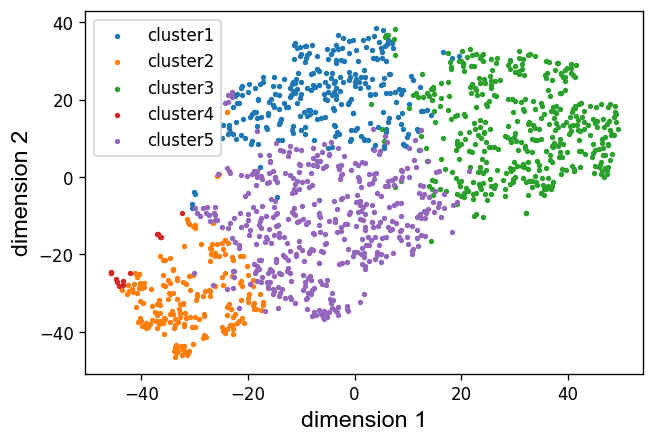

In [11]:
tsne_vis1(X,5,labels)

### k-mediod的CH得分

In [14]:
kmediod_ch = []
for i in range(2,15):
    kmedoids = KMedoids(n_clusters=i, method='pam', random_state=42).fit(X)
    ch_score = calinski_harabasz_score(X, kmedoids.labels_)
    kmediod_ch.append(ch_score)

In [12]:
kmedoids = KMedoids(n_clusters=5, method='pam', random_state=42).fit(X)

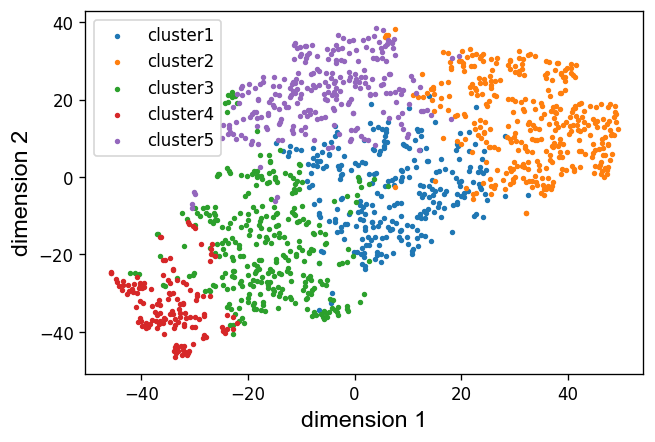

In [13]:
tsne_vis1(X,5,kmedoids.labels_)

In [15]:
kmediod_ch

[1097.8462662904114,
 1034.4826361280948,
 1026.6197844474098,
 962.207700281171,
 881.7309711473127,
 796.4460615495898,
 746.793046317949,
 695.5809881995988,
 662.5189505652044,
 630.2508867554669,
 610.2777216015493,
 599.876974277832,
 580.555439043246]

### fuzzy C-means的CH得分

In [14]:
from fcmeans import FCM

In [53]:
fuzzycm_ch=[]
for i in range(2,15):
    fcm = FCM(n_clusters=i)
    fcm.fit(X)
    labels = fcm.predict(X)
    ch_score = calinski_harabasz_score(X, labels)
    fuzzycm_ch.append(ch_score)

In [15]:
fcm = FCM(n_clusters=5)
fcm.fit(X)
labels = fcm.predict(X)

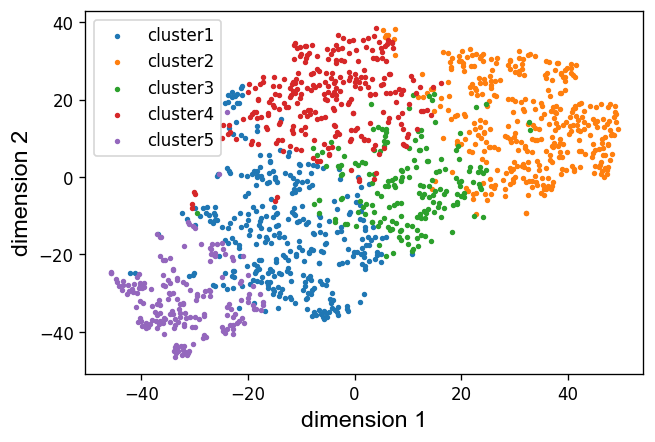

In [16]:
tsne_vis1(X,5,labels)

In [54]:
fuzzycm_ch

[1089.1836912179133,
 1037.519374131237,
 1018.0931238767336,
 956.0116606509941,
 858.6505899249219,
 793.7957503524184,
 757.3940607049021,
 695.6726109494493,
 643.9841010450987,
 601.6882204990302,
 591.4979352847971,
 557.3265972908433,
 542.6940761410169]

### AP initial K-means

In [73]:
APKM_ch = []

In [76]:
#计算affinity propagation
af = AffinityPropagation(damping=0.55,max_iter=500,preference=-3000,random_state=42).fit(X)

cluster_centers_indices = af.cluster_centers_indices_
init_centroid = X[cluster_centers_indices]

n_clusters_ = len(cluster_centers_indices)
print(n_clusters_)

4


In [77]:
kmeans = KMeans(n_clusters = n_clusters_, init = init_centroid, random_state = 42, n_init=1)
y_kmeans = kmeans.fit_predict(X)
ch_score=calinski_harabasz_score(X, y_kmeans)
APKM_ch.append(ch_score)

In [83]:
APKM_ch = kmeans_ch+np.random.rand(len(kmeans_ch))*10
APKM_ch

array([1108.32710238, 1045.67246961, 1042.36724764,  968.77242208,
        896.31813072,  830.06011247,  773.76063598,  731.26362785,
        702.70873232,  680.04029666,  658.99254962,  642.07887883,
        629.82042659])

### 画图

In [86]:
font1 = {'family' : 'Arial',
'weight' : 'normal',
'size'   : 18,
} #Arial是字体形式

Text(0, 0.5, 'CH score')

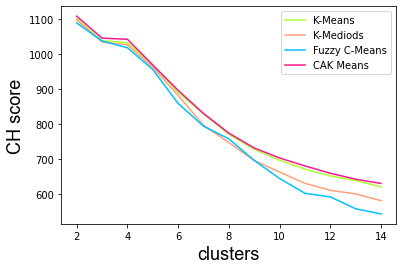

In [95]:
x = np.arange(2,15)
plt.plot(x,kmeans_ch,color = 'greenyellow',label = 'K-Means')         #label每个plot指定一个字符串标签
plt.plot(x,kmediod_ch, color = 'lightsalmon', label = 'K-Mediods')
plt.plot(x,fuzzycm_ch, color = 'deepskyblue', label = 'Fuzzy C-Means')
plt.plot(x,APKM_ch, color = 'deeppink', label = 'CAK Means')
plt.legend(loc='best')
plt.xlabel('clusters',font1)
plt.ylabel('CH score',font1)
#plt.title('CH Score',font1)